In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
!git clone https://github.com/niaz1971/BOOK_CHAPTERS.git

Cloning into 'BOOK_CHAPTERS'...
remote: Enumerating objects: 10, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 10 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (10/10), done.


In [3]:
cd BOOK_CHAPTERS/CROP_IMAGE_CLASSIFICATION/

/content/BOOK_CHAPTERS/CROP_IMAGE_CLASSIFICATION


In [4]:
!pip install lime kaggle
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d mdwaquarazam/agricultural-crops-image-classification

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 13.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=a12616e2657d3a53ddcb7cc47a04ade8c8aa9f3d30ce04146dffd6e8de65e73e
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime
Dataset URL: https://www.kaggle.com/datasets/mdwaquarazam/agricultural-crops-image-classification
License(s): CC0-1.0
100% 79.0M/79.0M [00:04<00:00, 16.9MB/s]



In [5]:
!unzip -q agricultural-crops-image-classification.zip
!rm agricultural-crops-image-classification.zip
!rm kaggle.json

## Mixed-precision training setup for speed

In [6]:
import tensorflow as tf
from tensorflow.keras import mixed_precision

# Enable mixed precision (float16) automatically if a GPU is available
gpus = tf.config.list_physical_devices('GPU')

if len(gpus) > 0:
    policy = mixed_precision.Policy('mixed_float16')
    mixed_precision.set_global_policy(policy)
    print("Mixed precision (float16) activated.")
else:
    print("No GPU detected. Using standard float32.")


Mixed precision (float16) activated.


## Set random seeds for reproducibility

In [7]:
import os
import random
import numpy as np
import tensorflow as tf

SEED = 420

# Python & OS
os.environ["PYTHONHASHSEED"] = str(SEED)

# Python RNG
random.seed(SEED)

# NumPy RNG
np.random.seed(SEED)

# TensorFlow RNG
tf.random.set_seed(SEED)


# 2. Data Preparation & Exploration

## Import dataset

In [8]:
# Agricultural-crops folder

Agricultural_Crops_folder = 'Agricultural-crops/'
Agricultural_Crops_folder

'Agricultural-crops/'

## Data Visualization (EDA)

In [9]:
import os

Crops_label = sorted(os.listdir(Agricultural_Crops_folder))
count_Crops_image = [len(os.listdir(os.path.join(Agricultural_Crops_folder + label))) for label in Crops_label]
Crops_image_df = pd.DataFrame({'Crops_label':Crops_label, 'count_Crops_image':count_Crops_image})
print(Crops_image_df.shape)
Crops_image_df

(30, 2)


,Crops_label,count_Crops_image
0,Cherry,32
1,Coffee-plant,29
2,Cucumber,31
3,Fox_nut(Makhana),23
4,Lemon,28
5,Olive-tree,30
6,Pearl_millet(bajra),39
7,Tobacco-plant,33
8,almond,21
9,banana,31


In [10]:
import plotly.express as px

class_names = Crops_image_df['Crops_label']
class_dis = Crops_image_df['count_Crops_image']

fig = px.pie(names = class_names, values = class_dis, title = 'Class Distribution', hole = 0.4)

fig.show()

## Image Visualization

In [11]:
import pathlib
from glob import glob

path = '../input/agricultural-crops-image-classification/'
data_dir = pathlib.Path(path)

In [12]:
import cv2

def read_image(path):
    image = cv2.imread(path, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [13]:
directories_list = tf.io.gfile.listdir(Agricultural_Crops_folder)

# Get number of labels
len_labels = len(directories_list)

vis_images = []
vis_labels = []
length_file_list = []
label_list = []

for item in directories_list:
    # Get each label directory
    item_dir = os.path.join(Agricultural_Crops_folder, item)
    # Get list of images of each label
    item_files = os.listdir(item_dir)
    # Number of images per label
    len_per_label = len(item_files)

    length_file_list.append(len_per_label)
    label_list.append(item)

    vis_images.append(os.path.join(item_dir, item_files[0]))
    vis_labels.append(item)

df_temp = (
    pd.DataFrame({
        'Labels': label_list,
        'Number of Images': length_file_list
    })
    .sort_values(by='Number of Images', ascending=False)
)

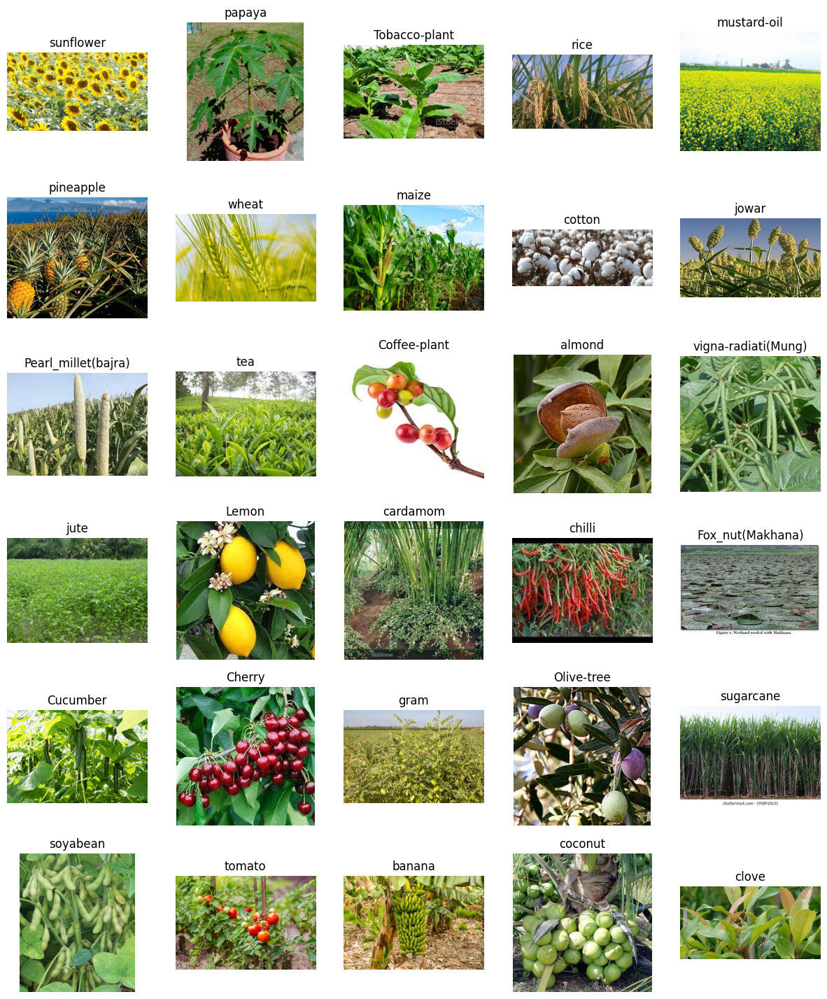

In [14]:
import cv2
import matplotlib.patches as mpatches
def display_sample_images(images, labels):
    num_images = len(images)
    num_rows = int(np.ceil(num_images / 5))  # Adjusting for the number of images
    plt.figure(figsize=(15, 3 * num_rows))   # Adjusting figure size
    for i in range(num_images):
        plt.subplot(num_rows, 5, i+1)        # Adjusting subplot dimensions
        img = cv2.imread(images[i])
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
        plt.imshow(img)
        plt.title(labels[i])
        plt.axis('off')
    plt.show()

# Display sample images
display_sample_images(vis_images, vis_labels)

## Data Augmentation Strategy

In [15]:
# Intialize Generator
from tensorflow.keras.preprocessing.image import ImageDataGenerator as ImgDataGen
from tensorflow.keras.applications.resnet_v2 import preprocess_input


train_gen = ImgDataGen(
    preprocessing_function=preprocess_input,
    rotation_range=25,           # rotate up to ±25 degrees
    width_shift_range=0.15,      # shift horizontally up to 20% of width
    height_shift_range=0.15,     # shift vertically up to 20% of height
    zoom_range=0.25,             # zoom in/out up to 25%
    shear_range=0.15,            # apply shear transformations
    #vertical_flip=True,          # flip images verstically (can confuse the model)
    horizontal_flip=True,        # flip images horizontally
    brightness_range=[0.9, 1.1], # vary brightness between 90% and 110%
    channel_shift_range=10.0,    # vary RGB channels
    fill_mode='nearest',         # fill in new pixels after transforms
    validation_split=0.1
)

val_gen = ImgDataGen(
    preprocessing_function=preprocess_input,
    validation_split=0.1
)

## Data splitting

In [16]:
# Load Data
train_ds = train_gen.flow_from_directory(
    Agricultural_Crops_folder,
    class_mode='categorical',
    shuffle=True,
    seed=SEED,
    batch_size=32,
    target_size=(224, 224),
    subset='training'
)

valid_ds = val_gen.flow_from_directory(
    Agricultural_Crops_folder,
    class_mode='categorical',
    shuffle=False,
    seed=SEED,
    batch_size=32,
    target_size=(224, 224),
    subset='validation'
)

Found 757 images belonging to 30 classes.
Found 72 images belonging to 30 classes.


## Handling Class Imbalance

In [17]:
from sklearn.utils import class_weight

# Get labels from the training generator / dataset
train_labels = train_ds.classes  # assumes a Keras DirectoryIterator / ImageDataGenerator

# Compute balanced class weights
class_weights_array = class_weight.compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_labels),
    y=train_labels
)

# Convert to a dict format expected by Keras (class_index -> weight)
class_weights_dict = dict(enumerate(class_weights_array))

print("Computed class weights:", class_weights_dict)


Computed class weights: {0: np.float64(0.8701149425287357), 1: np.float64(0.9345679012345679), 2: np.float64(0.9011904761904762), 3: np.float64(1.2015873015873015), 4: np.float64(0.9705128205128205), 5: np.float64(0.9345679012345679), 6: np.float64(0.700925925925926), 7: np.float64(0.8411111111111111), 8: np.float64(1.3280701754385964), 9: np.float64(0.9011904761904762), 10: np.float64(1.2616666666666667), 11: np.float64(1.2015873015873015), 12: np.float64(0.9345679012345679), 13: np.float64(1.0971014492753624), 14: np.float64(0.8701149425287357), 15: np.float64(1.0971014492753624), 16: np.float64(0.9345679012345679), 17: np.float64(1.2015873015873015), 18: np.float64(0.9011904761904762), 19: np.float64(0.9705128205128205), 20: np.float64(1.2015873015873015), 21: np.float64(1.0971014492753624), 22: np.float64(0.9345679012345679), 23: np.float64(0.9345679012345679), 24: np.float64(1.0971014492753624), 25: np.float64(1.146969696969697), 26: np.float64(1.2015873015873015), 27: np.float64(

# 3. Model Architecture Design

In [18]:
from tensorflow.keras.applications import ResNet50V2, InceptionV3, Xception # pre-Trained Learning Model
from tensorflow.keras.applications.vgg16 import VGG16 # pre-Trained Learning Model
from keras.models import Sequential
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

## CBAM Attention Layer

In [19]:
import tensorflow as tf
from tensorflow.keras import layers

class CBAMLayer(layers.Layer):
    def __init__(self, ratio=8, **kwargs):
        super().__init__(**kwargs)
        self.ratio = ratio

    def build(self, input_shape):
        channel = int(input_shape[-1])

        # MLP compartido para atención de canal
        self.mlp_dense1 = layers.Dense(channel // self.ratio, activation='relu')
        self.mlp_dense2 = layers.Dense(channel)

        # Convolución para atención espacial
        self.conv_spatial = layers.Conv2D(
            filters=1,
            kernel_size=7,
            padding='same',
            activation='sigmoid'
        )

        super().build(input_shape)

    def call(self, inputs):
        x = inputs  # (B, H, W, C)

        # ----- Channel Attention -----
        avg_pool = tf.reduce_mean(x, axis=[1, 2])   # (B, C)
        max_pool = tf.reduce_max(x, axis=[1, 2])    # (B, C)

        mlp_avg = self.mlp_dense2(self.mlp_dense1(avg_pool))
        mlp_max = self.mlp_dense2(self.mlp_dense1(max_pool))

        channel_attention = tf.nn.sigmoid(mlp_avg + mlp_max)  # (B, C)
        channel_attention = tf.reshape(
            channel_attention,
            (-1, 1, 1, x.shape[-1])   # (B, 1, 1, C)
        )

        x = x * channel_attention

        # ----- Spatial Attention -----
        avg_spatial = tf.reduce_mean(x, axis=-1, keepdims=True)  # (B, H, W, 1)
        max_spatial = tf.reduce_max(x, axis=-1, keepdims=True)   # (B, H, W, 1)

        concat = tf.concat([avg_spatial, max_spatial], axis=-1)  # (B, H, W, 2)
        spatial_attention = self.conv_spatial(concat)            # (B, H, W, 1)

        x = x * spatial_attention
        return x

## Pretrained ResNet50V2 + CBAM + Regularization


In [20]:
weight_decay = 1e-4
dropout_rate = 0.4

def add_dense_block(x, units: int, weight_decay: float, dropout_rate: float):
    """Dense + Dropout block with L2 regularization."""
    x = Dense(
        units,
        activation="relu",
        kernel_regularizer=regularizers.l2(weight_decay)
    )(x)
    x = Dropout(dropout_rate)(x)
    return x

In [21]:
from tensorflow.keras import Model, Input
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras import regularizers

IMG_SIZE = 224 # Standard for ResNet
NUM_CLASSES = train_ds.num_classes

# 1) Backbone
base_model = ResNet50V2(
    weights='imagenet',
    include_top=False,
    pooling=None,
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

# Freeze the backbone weights at the beginning
base_model.trainable = False

# 2) Arquitectura completa con CBAM
inputs = Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = base_model(inputs)
print("Feature map shape from base_model:", x.shape)

x = CBAMLayer()(x)                       # CBAM layer
x = GlobalAveragePooling2D()(x)         # (B, C)
x = add_dense_block(x, 2048, weight_decay, dropout_rate)
x = add_dense_block(x, 256, weight_decay, dropout_rate)

outputs = Dense(
    NUM_CLASSES,
    activation='softmax',
    kernel_regularizer=regularizers.l2(weight_decay),
    dtype='float32'
)(x)
model = Model(inputs, outputs, name="CBAM_ResNet50V2")

model.summary()

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Feature map shape from base_model: (None, 7, 7, 2048)


Model: "CBAM_ResNet50V2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50v2 (Functional)         │ (None, 7, 7, 2048)     │    23,564,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ cbam_layer (CBAMLayer)          │ (None, 7, 7, 2048)     │     1,050,979 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 2048)           │     4,196,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 30)             │         7,710 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,344,385 (111.94 MB)

 Trainable params: 5,779,585 (22.05 MB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [22]:
# ---------------------------------------------------------
# OPTION A: For One-Hot Encoded Labels (CURRENTLY ACTIVE)
# Use this when your generator has: class_mode='categorical'
# Required when using custom losses like Focal Loss.
# Label format example: [0, 0, 1, 0]
# ---------------------------------------------------------
top3 = tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top3_acc')

# ---------------------------------------------------------
# OPTION B: For Integer Labels (Standard Keras Default)
# Use this when your generator has: class_mode='sparse'
# Useful for saving memory if using standard SparseCategoricalCrossentropy.
# Label format example: 2
# ---------------------------------------------------------
#top3 = tf.keras.metrics.SparseTopKCategoricalAccuracy(k=3, name='top3_acc')
# loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)


'''model.compile(
    loss=loss_fn,
    optimizer=optimizer,
    metrics=['accuracy', top3]
)'''

# 4. Training Strategy

"model.compile(\n    loss=loss_fn,\n    optimizer=optimizer,\n    metrics=['accuracy', top3]\n)"

## Training Callbacks configuration

In [23]:
import tensorflow as tf
from tensorflow.keras.callbacks import Callback

class LrHistory(Callback):
    def __init__(self):
        super().__init__()
        self.lrs = []

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        lr = self.model.optimizer.learning_rate

        # Si es un schedule, lo evaluamos; si es un float/tensor, lo leemos directamente
        if isinstance(lr, tf.keras.optimizers.schedules.LearningRateSchedule):
            lr_value = lr(self.model.optimizer.iterations)
        else:
            lr_value = tf.keras.backend.get_value(lr)

        self.lrs.append(float(lr_value))
        logs["lr"] = float(lr_value)


In [24]:
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ModelCheckpoint,
    ReduceLROnPlateau,
    TerminateOnNaN
)

lr_history_cb = LrHistory()

early_stopping_cb = EarlyStopping(
    monitor="val_loss",
    patience=15,
    restore_best_weights=True,
    mode="min",
    verbose=1
)

reduce_lr_cb = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)


nan_cb = TerminateOnNaN()

# This is the list you already pass to model.fit
cbs = [
    early_stopping_cb,
    reduce_lr_cb,
    nan_cb,
    lr_history_cb
]

## Custom Focal Loss function

In [25]:
def categorical_focal_loss(gamma=2.0):
    """
    Focal Loss wrapper.
    It does not include an 'alpha' parameter because we are using
    Keras 'class_weight' during training to handle imbalance.
    """
    def focal_loss_fixed(y_true, y_pred):
        # 1. Ensure numerical stability (prevents log(0) errors)
        epsilon = tf.keras.backend.epsilon()
        y_pred = tf.clip_by_value(y_pred, epsilon, 1. - epsilon)

        # 2. Calculate basic Cross Entropy
        # Note: y_true must be one-hot encoded (e.g., [0, 1, 0])
        cross_entropy = -y_true * tf.math.log(y_pred)

        # 3. Calculate the Focal Term: (1 - p_t)^gamma
        # This down-weights easy examples (where y_pred is close to 1)
        # and focuses training on hard examples (where y_pred is low)
        loss = tf.math.pow((1 - y_pred), gamma) * cross_entropy

        # 4. Sum across the class axis to get a single loss value per image
        return tf.reduce_sum(loss, axis=1)

    return focal_loss_fixed

## Phase 1: Warm-up Training (Head only)

In [26]:
print("--- PHASE 1: Training only the top layers (head) ---\n")

# 1. Freeze the entire base model
base_model.trainable = False

# 2. Compile with a standard / slightly higher learning rate for the head
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
model.compile(
    loss=categorical_focal_loss(gamma=2.0),
    optimizer=optimizer,
    metrics=["accuracy", top3],
)

# 3. Train a few epochs (e.g., 10) to stabilize the head weights
history_phase1 = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=10,
    class_weight=class_weights_dict,  # use class weights to handle imbalance
    callbacks=[lr_history_cb],        # optional: callback to log LR history
)

--- PHASE 1: Training only the top layers (head) ---

Epoch 1/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 67s 2s/step - accuracy: 0.1519 - loss: 3.1466 - top3_acc: 0.2933 - val_accuracy: 0.3750 - val_loss: 2.2597 - val_top3_acc: 0.6528 - lr: 0.0010
Epoch 2/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 617ms/step - accuracy: 0.3871 - loss: 2.1062 - top3_acc: 0.5878 - val_accuracy: 0.4722 - val_loss: 1.5616 - val_top3_acc: 0.7500 - lr: 0.0010
Epoch 3/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 17s 695ms/step - accuracy: 0.4703 - loss: 1.7150 - top3_acc: 0.6935 - val_accuracy: 0.5556 - val_loss: 1.3437 - val_top3_acc: 0.7500 - lr: 0.0010
Epoch 4/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 626ms/step - accuracy: 0.5627 - loss: 1.3579 - top3_acc: 0.7715 - val_accuracy: 0.5694 - val_loss: 1.3104 - val_top3_acc: 0.7639 - lr: 0.0010
Epoch 5/10
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 616ms/step - accuracy: 0.6143 - loss: 1.1449 - top3_acc: 0.8428 - val_accuracy: 0.5833 - val_loss: 1.2125 - val_top3_acc: 0.7778 - lr: 0.0010
Epoch 6/10
24/24 ━━━━━━━━━━━━

## Phase 2: Fine-Tuning (Backbone Unfreezed)

In [27]:
print("--- PHASE 2: ResNet fine-tuning ---\n")

# 1. Unfreeze the last layers of the backbone
base_model.trainable = True

# We only train the last block (Stage 5) to preserve low-level features (edges/shapes)
# and avoid breaking Residual Blocks in half.
for layer in base_model.layers:
    if 'conv5' in layer.name:
        layer.trainable = True
    else:
        layer.trainable = False

# 2. Re-compile with a lower learning rate than phase 1
optimizer_ft = tf.keras.optimizers.Adam(learning_rate=1e-4)
model.compile(
    loss=categorical_focal_loss(gamma=2.0),
    optimizer=optimizer_ft,
    metrics=["accuracy", top3],
)

# 3. Train for the remaining epochs
history_phase2 = model.fit(
    train_ds,
    validation_data=valid_ds,
    initial_epoch=10,   # continue from the last epoch of Phase 1
    epochs=50,          # total number of epochs
    class_weight=class_weights_dict,
    callbacks=cbs
)

--- PHASE 2: ResNet fine-tuning ---

Epoch 11/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 70s 2s/step - accuracy: 0.6579 - loss: 1.0792 - top3_acc: 0.8456 - val_accuracy: 0.5694 - val_loss: 1.7055 - val_top3_acc: 0.8472 - learning_rate: 1.0000e-04 - lr: 1.0000e-04
Epoch 12/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 622ms/step - accuracy: 0.7886 - loss: 0.6067 - top3_acc: 0.9445 - val_accuracy: 0.5833 - val_loss: 1.6832 - val_top3_acc: 0.8194 - learning_rate: 1.0000e-04 - lr: 1.0000e-04
Epoch 13/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 637ms/step - accuracy: 0.8309 - loss: 0.5199 - top3_acc: 0.9485 - val_accuracy: 0.6250 - val_loss: 1.5689 - val_top3_acc: 0.8333 - learning_rate: 1.0000e-04 - lr: 1.0000e-04
Epoch 14/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 16s 644ms/step - accuracy: 0.8758 - loss: 0.4343 - top3_acc: 0.9657 - val_accuracy: 0.6806 - val_loss: 1.2495 - val_top3_acc: 0.8611 - learning_rate: 1.0000e-04 - lr: 1.0000e-04
Epoch 15/50
24/24 ━━━━━━━━━━━━━━━━━━━━ 15s 636ms/step - accuracy: 0.8838 - loss: 0.3618 - top3_acc

# 5. Results & Inference

## Training Metrics Analysis (Loss/Acc/LR)

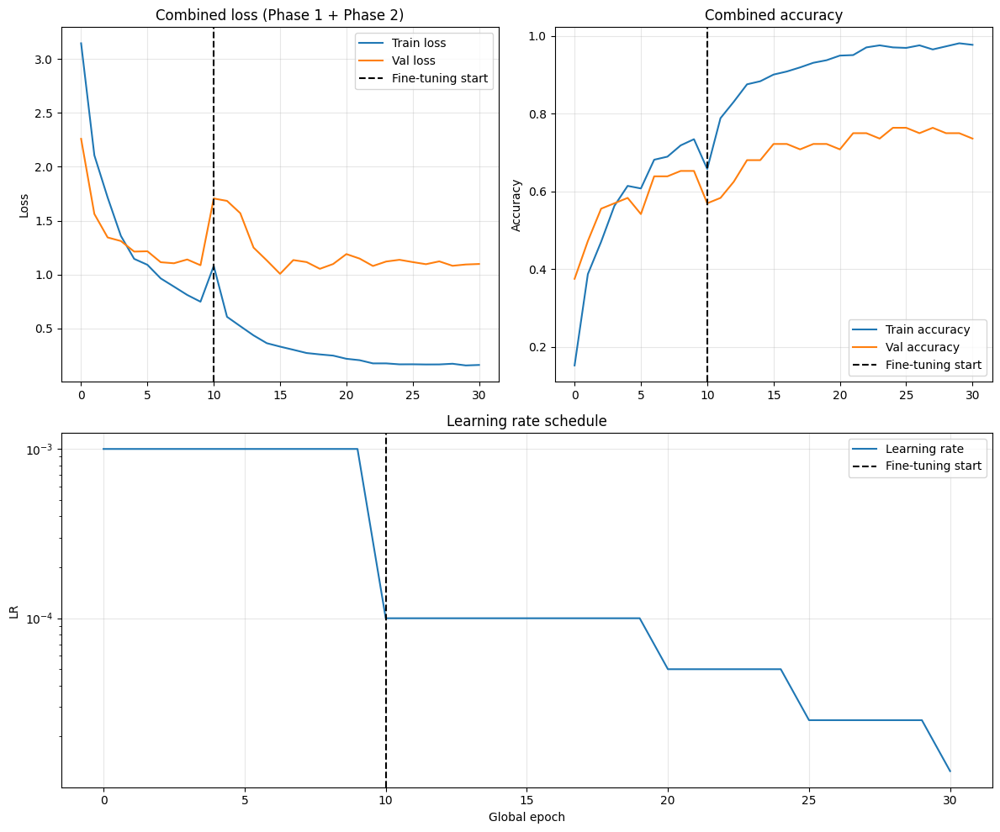

In [28]:
import matplotlib.pyplot as plt

def plot_combined_history(h1, h2):
    """
    Plot combined training history for two training phases:
    - Phase 1: warm-up / head training
    - Phase 2: fine-tuning
    """
    # Metrics we want to merge
    metrics_to_plot = ["loss", "val_loss", "accuracy", "val_accuracy", "lr"]

    # Dict to store the merged history
    combined = {}

    # Concatenate phase 1 and phase 2 histories
    for metric in metrics_to_plot:
        # Direct case: metric exists in both histories
        if metric in h1.history and metric in h2.history:
            combined[metric] = h1.history[metric] + h2.history[metric]
        # Special case: some callbacks log "learning_rate" instead of "lr"
        elif metric == "lr" and "learning_rate" in h1.history and "learning_rate" in h2.history:
            combined["lr"] = h1.history["learning_rate"] + h2.history["learning_rate"]

    # Epoch index where fine-tuning starts (end of phase 1)
    ft_start = len(h1.history["loss"])

    # --- PLOTTING ---
    plt.figure(figsize=(12, 10))

    # 1) Loss
    plt.subplot(2, 2, 1)
    plt.plot(combined["loss"], label="Train loss")
    plt.plot(combined["val_loss"], label="Val loss")
    plt.axvline(x=ft_start, color="black", linestyle="--", label="Fine-tuning start")
    plt.title("Combined loss (Phase 1 + Phase 2)")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(True, alpha=0.3)

    # 2) Accuracy
    plt.subplot(2, 2, 2)
    plt.plot(combined["accuracy"], label="Train accuracy")
    plt.plot(combined["val_accuracy"], label="Val accuracy")
    plt.axvline(x=ft_start, color="black", linestyle="--", label="Fine-tuning start")
    plt.title("Combined accuracy")
    plt.ylabel("Accuracy")
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)

    # 3) Learning rate (only if available)
    if "lr" in combined:
        plt.subplot(2, 1, 2)
        plt.plot(combined["lr"], label="Learning rate")
        plt.axvline(x=ft_start, color="black", linestyle="--", label="Fine-tuning start")
        plt.title("Learning rate schedule")
        plt.ylabel("LR")
        plt.xlabel("Global epoch")
        plt.yscale("log")  # log scale is usually clearer for LR
        plt.legend()
        plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

# --- RUN THE FUNCTION ---
# Make sure you stored your histories in:
# history_phase1 = model.fit(...)
# history_phase2 = model.fit(...)
try:
    plot_combined_history(history_phase1, history_phase2)
except NameError:
    print(
        "Make sure you have history_phase1 and history_phase2 defined:\n"
        "history_phase1 = model.fit(...)\n"
        "history_phase2 = model.fit(...)"
    )

## Confusion Matrix

In [29]:
# True labels from generator
y_true = valid_ds.classes  # shape: (num_val_samples,)

# Predicted probabilities
y_prob = model.predict(valid_ds)
y_pred = np.argmax(y_prob, axis=1)


3/3 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step


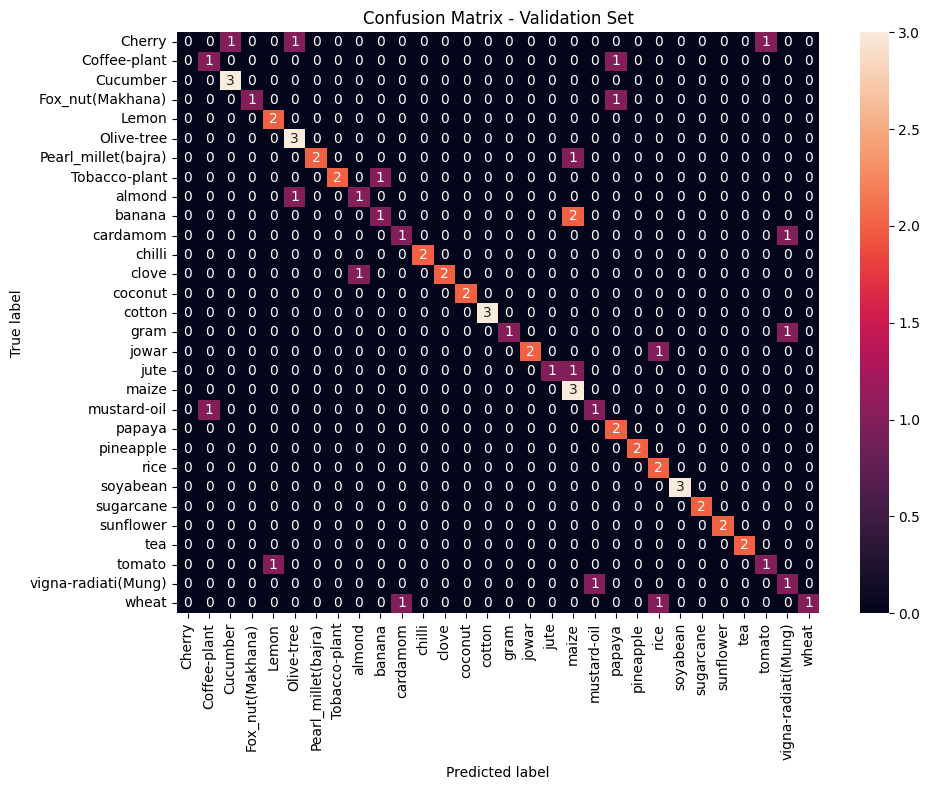

In [30]:
from sklearn.metrics import confusion_matrix

# Get class names in correct order
idx_to_class = {v: k for k, v in valid_ds.class_indices.items()}
class_names = [idx_to_class[i] for i in range(len(idx_to_class))]

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    xticklabels=class_names,
    yticklabels=class_names
)
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix - Validation Set')
plt.tight_layout()
plt.show()


In [31]:
from sklearn.metrics import classification_report

print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))


                     precision    recall  f1-score   support

             Cherry       0.00      0.00      0.00         3
       Coffee-plant       0.50      0.50      0.50         2
           Cucumber       0.75      1.00      0.86         3
   Fox_nut(Makhana)       1.00      0.50      0.67         2
              Lemon       0.67      1.00      0.80         2
         Olive-tree       0.60      1.00      0.75         3
Pearl_millet(bajra)       1.00      0.67      0.80         3
      Tobacco-plant       1.00      0.67      0.80         3
             almond       0.50      0.50      0.50         2
             banana       0.50      0.33      0.40         3
           cardamom       0.50      0.50      0.50         2
             chilli       1.00      1.00      1.00         2
              clove       1.00      0.67      0.80         3
            coconut       1.00      1.00      1.00         2
             cotton       1.00      1.00      1.00         3
               gram    

## Visual Predictions (Batch Inference)

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step


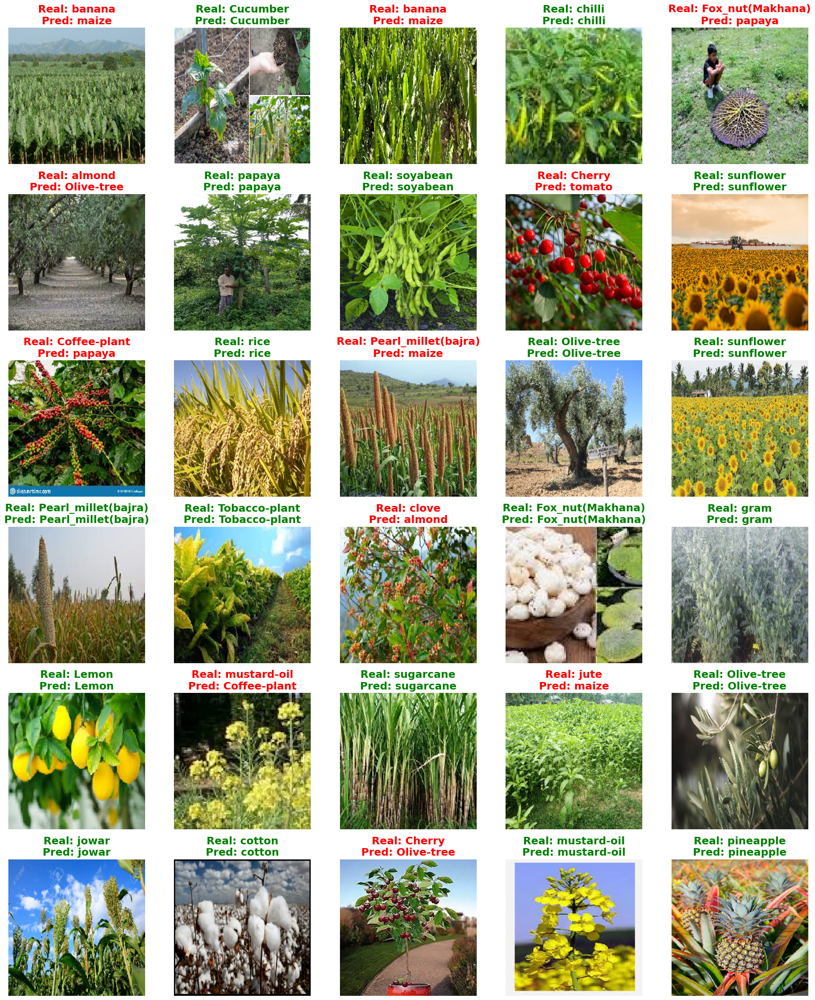

In [32]:
def deprocess_resnet_v2(x):
    x = (x + 1.0) * 127.5      # volver a [0, 255]
    x = np.clip(x, 0, 255).astype("uint8")
    return x



# 1. Collect enough images (e.g., 2 batches = 64 images)
# This avoids cycling the generator over and over
imgs_list = []
lbls_list = []

# Reset the generator for safety
valid_ds.reset()

# Take 2 full batches (adjust range if you want more variety)
for _ in range(2):
    imgs, lbls = next(valid_ds)
    imgs_list.append(imgs)
    lbls_list.append(lbls)

# Concatenate to have a single large array
X_val = np.concatenate(imgs_list)
y_val = np.concatenate(lbls_list)

# 2. Predict the whole collected set at once (Faster)
predictions = model.predict(X_val)
pred_classes = np.argmax(predictions, axis=1)

# 3. Random selection WITHOUT replacement (Guarantees NO DUPLICATES)
# Choose 30 random indices from the total collected
total_images = len(X_val)
random_indices = np.random.choice(total_images, size=min(30, total_images), replace=False)

# 4. Visualization
plt.figure(figsize=(20, 24))

for i, idx in enumerate(random_indices):
    image = X_val[idx]
    label = y_val[idx]
    pred = pred_classes[idx]

    plt.subplot(6, 5, i + 1)
    plt.imshow(deprocess_resnet_v2(image))

    real_index = np.argmax(label)

    real_text = Crops_label[real_index]
    pred_text = Crops_label[pred]

    # Green text if correct, red if wrong
    color = 'green' if real_text == pred_text else 'red'

    plt.title(f"Real: {real_text}\nPred: {pred_text}", color=color, fontsize=18, fontweight='bold')
    plt.axis('off')

plt.tight_layout()
plt.show()